# Installing packages

In [1]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy.optimize import minimize
from scipy.stats.stats import pearsonr  
from scipy import stats
from sklearn.metrics import r2_score
from itertools import combinations

%load_ext rpy2.ipython

/var/folders/ww/jwc_dkyx4_58jw9lnh79r69r0000gn/T/ipykernel_3685/4259127624.py:6: DeprecationWarning: Please import `pearsonr` from the `scipy.stats` namespace; the `scipy.stats.stats` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.stats.stats import pearsonr


In [2]:
%%R  -w 8 -h 3 #--units in -r 200
##installing packages and setting options for the plots in R

# {r settings, echo=F, message=F, error=F}
knitr::opts_chunk$set(echo = F)
if (!require("pacman")) install.packages("pacman")
pacman::p_load(ggplot2, patchwork, cowplot, tidyverse, devtools, ggrepel, ggh4x, officer, rvg, svglite, install = T)

# # Required on the first run, comment afterward?
devtools::install_github("BlakeRMills/MoMAColors")
library(MoMAColors)

theme_set(theme_cowplot() +
          theme(text = element_text(size=9),
                axis.text = element_text(size=9),
                panel.grid.major.x = element_blank() ,
                panel.grid.major.y = element_line( linewidth=.1, color="black")))

Loading required package: pacman
Skipping install of 'MoMAColors' from a github remote, the SHA1 (6f5d75de) has not changed since last install.
  Use `force = TRUE` to force installation


# The miraculous/naive case of english

In [8]:
data = pd.read_csv('data_ngram_allLangsPerMilion.csv')

df = data[data.lang.isin(['en'])]
target = np.array(df['log_freq'])
freqs = df.corrected_total_freq

best_R2 = 0
number_probs = np.zeros(100)
number_probs[0] = 1
number_probs[1] = freqs[0]
add_cost = freqs[1]/freqs[0]/freqs[0]  

mult_costs = [
    freqs[5]/freqs[1]/freqs[2],
    freqs[7]/freqs[1]/freqs[3],
    freqs[8]/freqs[2]/freqs[2],
    # freqs[11]/freqs[2]/freqs[3],
    # freqs[11]/freqs[1]/freqs[5],
]

mult_costs_boundaries = ['6=2x3', '8=2x4', '9=3x3']
results = []
for k, mult_cost in enumerate(mult_costs):
    number_probs = np.zeros(100)
    number_probs[0] = 1
    number_probs[1] = freqs[0]
    for i in range(1,100):
        if number_probs[i]==0:
            for j in range(1,i//2 +1):
                number_probs[i] = max(number_probs[i],number_probs[j]*number_probs[i-j]*add_cost) 
            for j in range(2, int(np.sqrt(i))+1):
                if i%j==0:
                    number_probs[i]= max(number_probs[i],number_probs[j]*number_probs[i//j]*mult_cost)
    result = np.log10(number_probs[1:100])

    R2 = (r2_score(result,df.log_freq))
    print(R2)
    numbers = [i+1 for i in range(99)]
    preds = {
    'number':numbers,
    'log_freq': df.log_freq,
    'predictions':result,
    'R2':[R2]*len(numbers),
    'mult_boundary':[mult_costs_boundaries[k]]*len(numbers),
    }
    y = np.array(result)
    X = np.log10(np.array(numbers))
    X = sm.add_constant(X)
    model = sm.OLS(y, X).fit()

    print(model.summary())
    results.append(pd.DataFrame(preds))


df2 = pd.concat(results)
df2.to_csv('temp.csv')
    

0.4927412785798566
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.962
Model:                            OLS   Adj. R-squared:                  0.962
Method:                 Least Squares   F-statistic:                     2486.
Date:                Tue, 07 Jan 2025   Prob (F-statistic):           6.06e-71
Time:                        20:29:31   Log-Likelihood:                 50.656
No. Observations:                  99   AIC:                            -97.31
Df Residuals:                      97   BIC:                            -92.12
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.5152      0.060 

In [6]:
y = np.array(df2['predictions'])
X = np.log(np.array(df2['number']))
X = sm.add_constant(X)
# Fit the model
model = sm.OLS(y, X).fit()
model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.920
Model:                            OLS   Adj. R-squared:                  0.920
Method:                 Least Squares   F-statistic:                     3406.
Date:                Tue, 07 Jan 2025   Prob (F-statistic):          4.47e-164
Time:                        20:23:45   Log-Likelihood:                 16.477
No. Observations:                 297   AIC:                            -28.95
Df Residuals:                     295   BIC:                            -21.57
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.5596      0.054     65.849      0.000       3.453       3.666
x1            -0.8429      0.014    -58.364      0.000      -0.871      -0.814
==============================================================================
Omnibus:                       15.035   Durbin-Watson:                   0.974
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               16.370
Skew:                          -0.575   Prob(JB):                     0.000279
Kurtosis:                       2.977   Cond. No.                         16.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

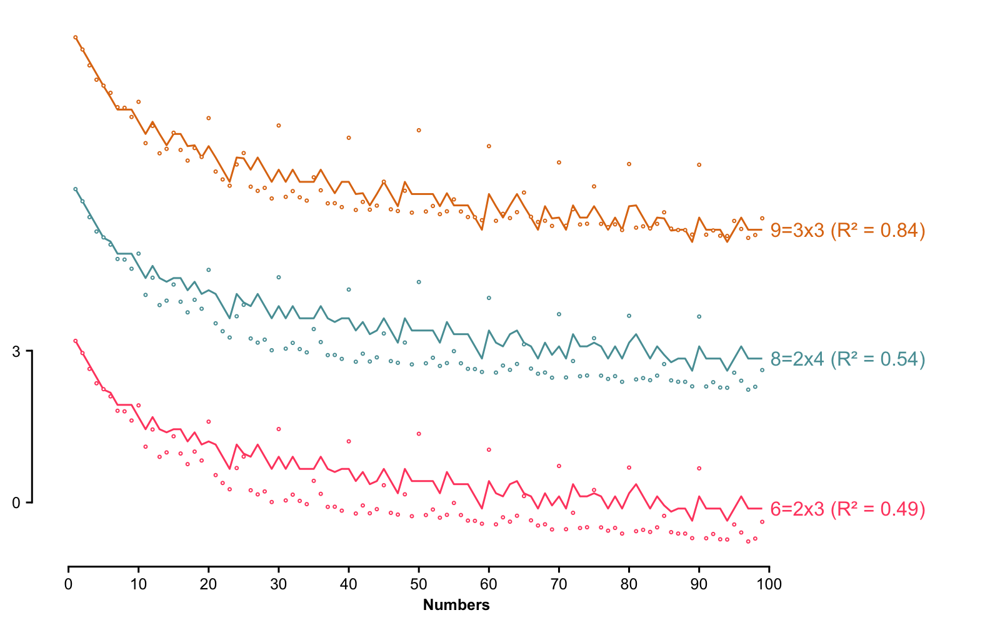

In [5]:
%%R -w 8 -h 5 --units in -r 200 

data <- read.csv('temp.csv')
pl_naive_model <- data %>%
    mutate(mult_boundary = factor(mult_boundary, levels=c('6=2x3', '8=2x4', '9=3x3'))) %>%

    mutate(label = if_else(number == max(number), 
                paste0(mult_boundary, " (R² = ", round(R2, 2), ")"), 
                NA_character_)) %>%
                
    ggplot(aes(x = number, y = 3*(as.numeric(mult_boundary)-1) + predictions, color=mult_boundary, group=mult_boundary)) +
    geom_line(linewidth=0.5) +

    geom_point(aes(y = 3*(as.numeric(mult_boundary)-1) + log_freq), size = 0.5, shape = 21, fill = "white") +
#     annotate("text", x = 60, y = 2.8, label = paste("R² =", R2), size = 4, hjust = 0, fontface = "bold") +
    geom_text_repel(aes(label = label), size=4,nudge_x = 4, na.rm = TRUE) +

    theme(legend.position = "none",
            axis.title.y=element_blank(),
            panel.grid.major.y = element_blank(),
            axis.title.x = element_text(face="bold", size=9, hjust=0.44, family='Arial')) +
    labs(x = "Numbers") +
    scale_color_manual(values=moma.colors("Klein")) +
    xlim(1,125) +
    guides(x = guide_axis_manual(trunc_lower=0, trunc_upper=100, breaks=seq(0,100,10)),
            y = guide_axis_manual(trunc_lower=0, trunc_upper=3, breaks=c(0,3)))

ggsave("plots/3B_naive_model.svg", pl_naive_model, device='svg',width = 8, height = 5, units = "in")
pl_naive_model

### Trying to generalize to other languages

In [14]:
data = pd.read_csv('data_ngram_allLangsPerMilion.csv')

df = data[data.lang.isin(['es'])]
target = np.array(df['log_freq'])
freqs = np.array(df.corrected_total_freq)

df2 = data[data.lang.isin(['en'])]
freqs2 = np.array(df2.corrected_total_freq)

best_R2 = 0
number_probs = np.zeros(100)
number_probs[0] = 1

estimated_f1 = freqs[1]*(freqs2[0]/freqs2[1])
number_probs[1] = estimated_f1
add_cost = freqs[1]/estimated_f1/estimated_f1  

mult_costs = [
    freqs[5]/freqs[1]/freqs[2],
    freqs[8]/freqs[2]/freqs[2],
    freqs[9]/freqs[4]/freqs[1],
    freqs[11]/freqs[2]/freqs[3],
    freqs[11]/freqs[1]/freqs[5],
]

for mult_cost in mult_costs:
    number_probs = np.zeros(100)
    number_probs[0]=1
    number_probs[1] = estimated_f1
    for i in range(1,100):
        if number_probs[i]==0:
            for j in range(1,i//2 +1):
                number_probs[i] = max(number_probs[i],number_probs[j]*number_probs[i-j]*add_cost) 
            for j in range(2, int(np.sqrt(i))+1):
                if i%j==0:
                    number_probs[i]= max(number_probs[i],number_probs[j]*number_probs[i//j]*mult_cost)
    result = np.log10(number_probs[1:100])

    without_10 = [i for i in range(100) if (i+1)%10!=0]
    R2 = (pearsonr(result[without_10],target[without_10]).statistic)**2
    print(mult_cost)
    print(R2)
    if R2>best_R2:
        best_R2=R2
        best_mult_cost = mult_cost

number_probs = np.zeros(100)
number_probs[0] = 1
number_probs[1] = estimated_f1
for i in range(1,100):
    if number_probs[i]==0:
        for j in range(1,i//2 +1):
            number_probs[i] = max(number_probs[i],number_probs[j]*number_probs[i-j]*add_cost) 
        for j in range(2, int(np.sqrt(i))+1):
            if i%j==0:
                number_probs[i]= max(number_probs[i],number_probs[j]*number_probs[i//j]*mult_cost)
result = np.log10(number_probs[1:100])
R2 = (pearsonr(result,df.log_freq).statistic)**2
numbers = [i+1 for i in range(99)]
preds = {
    'numbers':numbers,
    'log_freq': df.log_freq,
    'predictions':result,
    'R2':[R2]*len(numbers)

}
df2 = pd.DataFrame(preds)
df2.to_csv('temp.csv')
    

0.0002767936429674756
0.9088510003895353
0.00025338417718625053
0.9094355131839361
0.0008540414139177177
0.6689405696253178
0.0005774908506060986
0.8727895682656405
0.00045572090047724925
0.9004615221009189


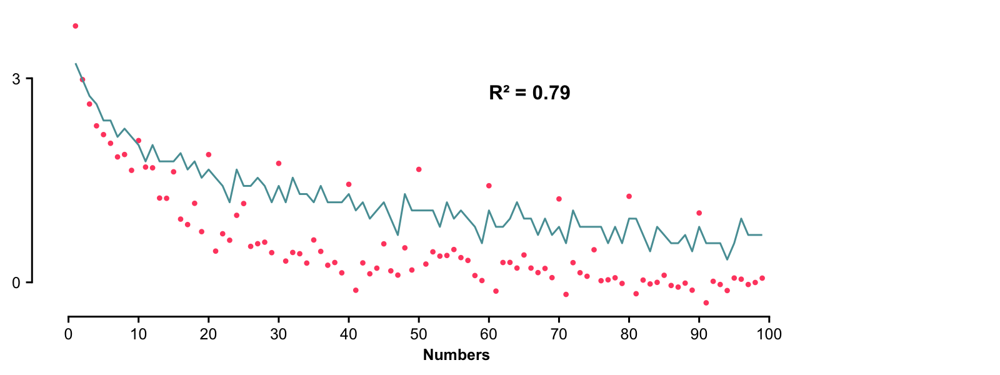

In [15]:
%%R -w 8 -h 3 --units in -r 200 

data <- read.csv('temp.csv')
R2 <- round(data$R2[1],2)
pl_model_with10 <- data %>%
    ggplot(aes(x = numbers)) +
    geom_point(aes(y = log_freq, color='line'),size=0.8) +
    geom_line(aes(y = predictions, color='point'), linewidth=0.5) +
    annotate("text", x = 60, y = 2.8, label = paste("R² =", R2), size = 4, hjust = 0, fontface = "bold") +
    theme(legend.position = "none",
            axis.title.y=element_blank(),
            panel.grid.major.y = element_blank(),
            axis.title.x = element_text(face="bold", size=9, hjust=0.44, family='Arial')) +
    labs(x = "Numbers") +
    scale_color_manual(values=moma.colors("Klein")) +
    xlim(1,125) +
    guides(x = guide_axis_manual(trunc_lower=0, trunc_upper=100, breaks=seq(0,100,10)),
            y = guide_axis_manual(trunc_lower=0, trunc_upper=3, breaks=c(0,3)))

# ggsave("plots/3B_model_english_with10.svg", pl_model, device='svg',width = 8, height = 3, units = "in")
pl_model_with10

# Optimized model for english

In [16]:
def get_probs_max(add_cost, mult_cost, f1):
    number_probs = np.zeros(100)
    number_probs[0]=1
    number_probs[1] = f1    
    for i in range(1,100):
        if number_probs[i]==0:
            for j in range(1,i//2 +1):
                number_probs[i] = max(number_probs[i],number_probs[j]*number_probs[i-j]*add_cost) 
            for j in range(2, int(np.sqrt(i))+1):
                if i%j==0:
                    number_probs[i]= max(number_probs[i],number_probs[j]*number_probs[i//j]*mult_cost)
    return np.log10(number_probs[1:100])

def loss_function(params, target_vector):
    add_cost, mult_cost, f1 = params
    predictions = get_probs_max(add_cost, mult_cost, f1)
    without_10 = [i for i in range(predictions.shape[0]) if (i+1)%10!=0]
    # predictions, target_vector = predictions[without_10], target_vector[without_10]
    return np.sum((predictions - target_vector) ** 2)

In [17]:
data = pd.read_csv('data_ngram_allLangsPerMilion.csv')

df = data[data.lang.isin(['en'])]
target = np.array(df['log_freq'])
freqs = df.corrected_total_freq
## we define the initial guess for the optimization as what would be 
##the parameters accounting for the first few numbers
## so that the initial guess is in the right neigborhood
initial_guess = [freqs[1]/freqs[0]/freqs[0], freqs[5]/freqs[1]/freqs[2], freqs[0]]
##            = freq(2)/freq(1)^2             , freq(6)/(freq(2)*freq(3))    , freq(1)   
print(f'Inital guess: {initial_guess}')
result = minimize(loss_function, initial_guess, args=(target,), method = 'Nelder-Mead')
best_params = result.x

print("Optimized Parameters:", best_params)
predictions = get_probs_max(*best_params)
R2 = (r2_score(predictions,df.log_freq))
print(f'R2 = {R2}')

numbers = [i+1 for i in range(99)]
preds = {
    'numbers':numbers,
    'log_freq': df.log_freq,
    'predictions':predictions,
    'R2':[R2]*len(numbers)

}
df2 = pd.DataFrame(preds)
df2.to_csv('temp.csv')


Inital guess: [0.0003669579382946686, 0.0003186047933210102, 1565.2685127018156]
Optimized Parameters: [6.03320401e-04 2.82659349e-04 1.02398408e+03]
R2 = 0.8345240437821009


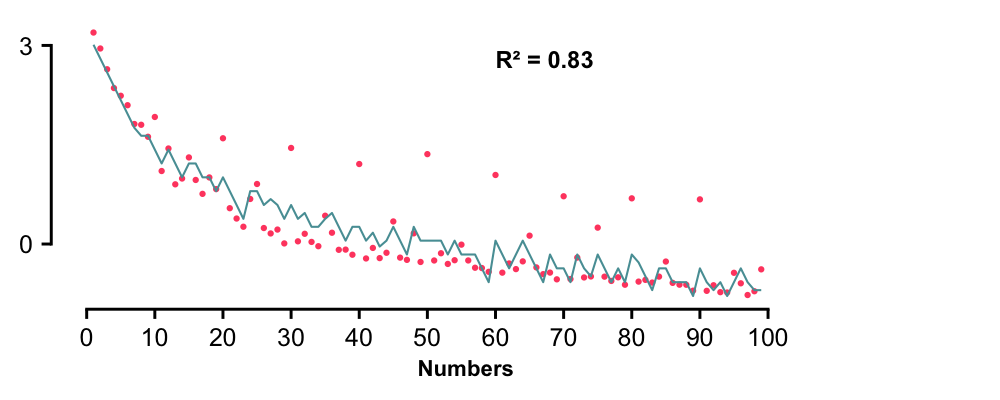

In [18]:
%%R -w 5 -h 2 --units in -r 200 

data <- read.csv('temp.csv')
R2 <- round(data$R2[1],2)
pl_model <- data %>%
    ggplot(aes(x = numbers)) +
    geom_point(aes(y = log_freq, color='line'),size=0.4) +
    geom_line(aes(y = predictions, color='point'), linewidth=0.35) +
    annotate("text", x = 60, y = 2.8, label = paste("R² =", R2), size = 3, hjust = 0, fontface = "bold") +
    theme(legend.position = "none",
            axis.title.y=element_blank(),
            panel.grid.major.y = element_blank(),
            axis.title.x = element_text(face="bold", size=8, hjust=0.44, family='Arial')) +
    labs(x = "Numbers") +
    scale_color_manual(values=moma.colors("Klein")) +
    xlim(1,125) +
    guides(x = guide_axis_manual(trunc_lower=0, trunc_upper=100, breaks=seq(0,100,10)),
            y = guide_axis_manual(trunc_lower=0, trunc_upper=3, breaks=c(0,3)))

ggsave("plots/4B_model_english_MDL.svg", pl_model, device='svg',width = 5.2, height = 2.1, units = "in")
pl_model

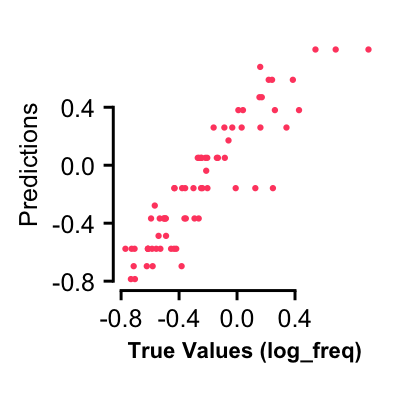

In [19]:
%%R -w 2 -h 2 --units in -r 200 

data <- read.csv('temp.csv')
filtered_data <- data %>%
    filter(numbers >= 21 & numbers <= 99 & numbers %% 10 != 0)

pl_model <- filtered_data %>%
    ggplot(aes(x = log_freq, y = predictions, color='line')) +
    geom_point(size = 0.4) +
    labs(x = "True Values (log_freq)", y = "Predictions") +
    coord_equal() +

    theme(legend.position = "none",
        # axis.title.y=element_blank(),
        panel.grid.major.y = element_blank(),
        axis.title.x = element_text(face="bold", size=8, hjust=0.44, family='Arial')) +
    scale_color_manual(values=moma.colors("Klein")) +
    guides(x = guide_axis_manual(trunc_lower=-0.8, trunc_upper=0.4, breaks=c(-0.8,-0.4,0,0.4)),
            y = guide_axis_manual(trunc_lower=-0.8, trunc_upper=0.4, breaks=c(-0.8,-0.4,0,0.4)))

ggsave("plots/4B_model_english_MDL_two_words_numbers.svg", pl_model, device='svg',width = 2, height = 2, units = "in")
pl_model



# Adding approximate number system

In [66]:
def gaussian(x):
    return(
        np.exp(-(x**2)/2)
    )

/var/folders/ww/jwc_dkyx4_58jw9lnh79r69r0000gn/T/ipykernel_3685/4257953933.py:8: RuntimeWarning: divide by zero encountered in log10
  distrib[i] = gaussian((np.log10(n) - np.log10(i))/w)
/var/folders/ww/jwc_dkyx4_58jw9lnh79r69r0000gn/T/ipykernel_3685/4257953933.py:8: RuntimeWarning: invalid value encountered in scalar subtract
  distrib[i] = gaussian((np.log10(n) - np.log10(i))/w)
/Users/maxencepajot/miniconda3/envs/numbers/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/maxencepajot/miniconda3/envs/numbers/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/var/folders/ww/jwc_dky

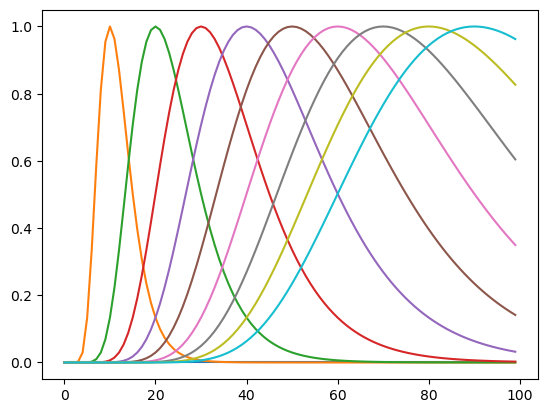

In [67]:
import seaborn as sns
w = 0.15
numbers = [i for i in range(100)]
multiples_10 = [10*i for i in range(10)]
distrib = np.zeros(100)
for n in multiples_10:
    for i in range(100):
        distrib[i] = gaussian((np.log10(n) - np.log10(i))/w)
    sns.lineplot(distrib)

In [68]:
w = 0.15
approx_range = 40
def approx_numbers(n,approx_range):
    return [n-j for j in range(1,approx_range) if n-j>0] + [n+j for j in range(1,approx_range) if n+j<100]


def get_probs_max_approx(add_cost, mult_cost, f1, alpha):
    number_probs = np.zeros(100)
    number_probs[0]=1
    number_probs[1] = f1   
    # number_probs[5] = 300 
    for i in range(1,100):
        if number_probs[i]==0:
            for j in range(1,i//2 +1):
                number_probs[i] = max(number_probs[i],number_probs[j]*number_probs[i-j]*add_cost) 
            for j in range(2, int(np.sqrt(i))+1):
                if i%j==0:
                    number_probs[i]= max(number_probs[i],number_probs[j]*number_probs[i//j]*mult_cost)

    multiples_10 = [10*i for i in range(1,10)]
    for n in multiples_10:
        prob_appros = []
        for i in approx_numbers(n, approx_range):
            prob_appro = alpha*gaussian((np.log10(n) - np.log10(i))/w)
            number_probs[i] = (1-prob_appro)*number_probs[i]
            print(i)
            print(prob_appro)
            prob_appros.append(prob_appro)
        number_probs[n] =(1+sum(prob_appros))* number_probs[n]
    
    return np.log10(number_probs[1:100])

def loss_function_approx(params, target_vector):
    add_cost, mult_cost, f1, alpha = params
    predictions = get_probs_max_approx(add_cost, mult_cost, f1, alpha)
    return np.sum((predictions - target_vector) ** 2)

In [81]:
data = pd.read_csv('data_ngram_allLangsPerMilion.csv')

df = data[data.lang.isin(['en'])]
target = np.array(df['log_freq'])
freqs = df.corrected_total_freq
## we define the initial guess for the optimization as what would be 
##the parameters accounting for the first few numbers
## so that the initial guess is in the right neigborhood
initial_guess = [freqs[1]/freqs[0]/freqs[0], freqs[5]/freqs[1]/freqs[2], freqs[0], 0.5]
##            = freq(2)/freq(1)^2             , freq(6)/(freq(2)*freq(3))    , freq(1)   
print(f'Inital guess: {initial_guess}')
result = minimize(loss_function_approx, initial_guess, args=(target,), method = 'Nelder-Mead')
best_params = result.x

print("Optimized Parameters:", best_params)
predictions = get_probs_max_approx(*best_params)
R2 = (r2_score(predictions,df.log_freq))
print(f'R2 = {R2}')

numbers = [i+1 for i in range(99)]
preds = {
    'numbers':numbers,
    'log_freq': df.log_freq,
    'predictions':predictions,
    'R2':[R2]*len(numbers)

}
df2 = pd.DataFrame(preds)
df2.to_csv('temp.csv')


Inital guess: [0.0003669579382946686, 0.0003186047933210102, 1565.2685127018156, 0.5]
9
0.4772690444507536
8
0.4058188888528378
7
0.29335819846375066
6
0.16748602704694496
5
0.06674312178459542
4
0.0148141130297691
3
0.0011491287517454763
2
9.635895333872305e-06
1
1.1168157181015791e-10
11
0.48132059056655097
12
0.43497219283090016
13
0.37468851048439283
14
0.3110917970382576
15
0.25102147900153476
16
0.19808969551471742
17
0.15361647749594318
18
0.11750936788072643
19
0.0889311164368167
20
0.06674312178459531
21
0.04976837735966165
22
0.03692834375834386
23
0.027300264192743416
24
0.02012877896053467
25
0.01481411302976906
26
0.01089035398892276
27
0.008001386435500822
28
0.00587830225130395
29
0.0043199004363327674
30
0.00317668173249046
31
0.0023381421767555226
32
0.0017229177092964387
33
0.0012712677553670941
34
0.0009394135882292339
35
0.0006953133155912495
36
0.0005155309420140275
37
0.0003829283281493338
38
0.0002849703613207324
39
0.00021248391118294045
40
0.0001587508471119901

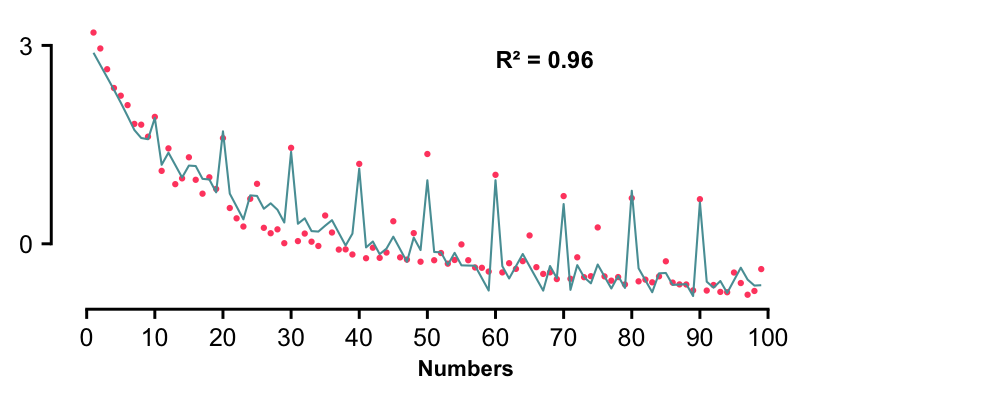

In [82]:
%%R -w 5 -h 2 --units in -r 200 

data <- read.csv('temp.csv')
R2 <- round(data$R2[1],2)
pl_model <- data %>%
    ggplot(aes(x = numbers)) +
    geom_point(aes(y = log_freq, color='line'),size=0.4) +
    geom_line(aes(y = predictions, color='point'), linewidth=0.35) +
    annotate("text", x = 60, y = 2.8, label = paste("R² =", R2), size = 3, hjust = 0, fontface = "bold") +
    theme(legend.position = "none",
            axis.title.y=element_blank(),
            panel.grid.major.y = element_blank(),
            axis.title.x = element_text(face="bold", size=8, hjust=0.44, family='Arial')) +
    labs(x = "Numbers") +
    scale_color_manual(values=moma.colors("Klein")) +
    xlim(1,125) +
    guides(x = guide_axis_manual(trunc_lower=0, trunc_upper=100, breaks=seq(0,100,10)),
            y = guide_axis_manual(trunc_lower=0, trunc_upper=3, breaks=c(0,3)))

ggsave("plots/5A_model_english_MDL_with_approx.svg", pl_model, device='svg',width = 5.2, height = 2.1, units = "in")
pl_model

# Checking if the model has the same type of regularities as the data, i.e. same log10 decrease, and importance of divisibility by 2,3,5,10

In [83]:
best_params = result.x
best_params

array([8.42940815e-04, 4.41048136e-04, 7.73853519e+02, 1.99963108e-01])

In [84]:
# best_params = (6.03320401e-04, 2.82659349e-04, 1.02398408e+03)
best_params = (8.42940815e-04, 4.41048136e-04, 7.73853519e+02, 1.99963108e-01)

data = pd.read_csv('data_ngram_allLangsPerMilion.csv')
df = data[data.lang.isin(['en'])]

y = get_probs_max_approx(*best_params)

X = np.array(df[['log10', 'mult2', 'mult3','mult5', 'mult10']])
X = sm.add_constant(X)

# Fit the model
model = sm.OLS(y, X).fit()
predictions = model.predict(X)
R2 = model.rsquared
print(model.pvalues)
print(model.summary())

9
0.19087240296112568
8
0.16229761260024
7
0.11732163424418482
6
0.06698205302975835
5
0.026692324139340414
4
0.005924552167391852
3
0.00045956671338237174
2
3.8536471586476075e-06
1
4.466438841096872e-11
11
0.192492722468166
12
0.17395678314408422
13
0.14984775817669954
14
0.12441376521815038
15
0.10039007023180725
16
0.0792212623557931
17
0.06143525656020171
18
0.04699507684109086
19
0.0355658848812315
20
0.02669232413934037
21
0.019903678833909554
22
0.01476861278242168
23
0.010918091354404169
24
0.008050026402387044
25
0.005924552167391836
26
0.004355338061690386
27
0.003199964199903572
28
0.00235088717586827
29
0.0017276414349993126
30
0.001270438304711234
31
0.0009350843532198393
32
0.0006890399599583127
33
0.0005084133029267757
34
0.0003756961215994997
35
0.00027807402323882217
36
0.00020617433887058542
37
0.00015314307727596935
38
0.00011396711827515328
39
8.497788656027346e-05
40
6.348862557229274e-05
41
4.752964452837835e-05
42
3.565521161312544e-05
43
2.6802738760790157e-05


# Model for english, correcting for multiples of 5 and 10

In [3]:
def get_probs_max(add_cost, mult_cost, f1):
    number_probs = np.zeros(100)
    number_probs[0] = 1
    number_probs[1] = f1    
    # number_probs[5] = f5

    for i in range(1,100):
        if number_probs[i]==0:
            for j in range(1,i//2 +1):
                number_probs[i] = max(number_probs[i],number_probs[j]*number_probs[i-j]*add_cost) 
            for j in range(2, int(np.sqrt(i))+1):
                if i%j==0:
                    number_probs[i]= max(number_probs[i],number_probs[j]*number_probs[i//j]*mult_cost)
    return np.log10(number_probs[1:100])

def loss_function(params, target_vector):
    add_cost, mult_cost, f1 = params
    predictions = get_probs_max(add_cost, mult_cost, f1)
    without_10 = [i for i in range(predictions.shape[0]) if (i+1)%10!=0]
    predictions, target_vector = predictions[without_10], target_vector[without_10]
    return np.sum((predictions - target_vector) ** 2)

def fit_10(predictions, penalty):
    new_predictions = predictions.copy()
    for i in range(len(predictions)):
        if (i+1)%10==0 and i+1!=10:
            new_predictions[i]=new_predictions[(i+1)//10 + 1]*penalty
    return new_predictions

def optimize_penalty(predictions, freqs):
    x = predictions[0:9]
    only_10s = [i for i in range(predictions.shape[0]) if (i+1)%10==0]
    y = freqs[only_10s]
    model = sm.OLS(y, x).fit()
    return  model.params[0]

In [4]:
data = pd.read_csv('data_ngram_allLangsPerMilion.csv')

df = data[data.lang.isin(['en'])]
target = np.array(df['log_freq'])
freqs = df.corrected_total_freq
## we define the initial guess for the optimization as what would be 
##the parameters accounting for the first few numbers
## so that the initial guess is in the right neigborhood
initial_guess = [freqs[1]/freqs[0]/freqs[0], freqs[5]/freqs[1]/freqs[2], freqs[0]]
##            = freq(2)/freq(1)^2         , freq(6)/(freq(2)*freq(3))  , freq(1), freq(5) 
print(f'Inital guess: {initial_guess}')
result = minimize(loss_function, initial_guess, args=(target,), method = 'Nelder-Mead')
best_params = result.x

print("Optimized Parameters:", best_params)
predictions = get_probs_max(*best_params)

penalty = optimize_penalty(predictions, target)
print(f'Optimized penalty: {penalty}')
predictions_with_10 = fit_10(predictions, penalty)

R2 = (pearsonr(predictions_with_10,df.log_freq).statistic)**2
print(f'R2 = {R2}')

numbers = [i+1 for i in range(99)]
preds = {
    'numbers':numbers,
    'log_freq': df.log_freq,
    'predictions':predictions_with_10,
    'R2':[R2]*len(numbers)

}
df2 = pd.DataFrame(preds)
df2.to_csv('temp.csv')

Inital guess: [0.0003669579382946686, 0.0003186047933210102, 1565.2685127018156]
Optimized Parameters: [7.10827529e-04 3.17776166e-04 8.71588692e+02]
Optimized penalty: 0.5656927052061874
R2 = 0.9561249463224157


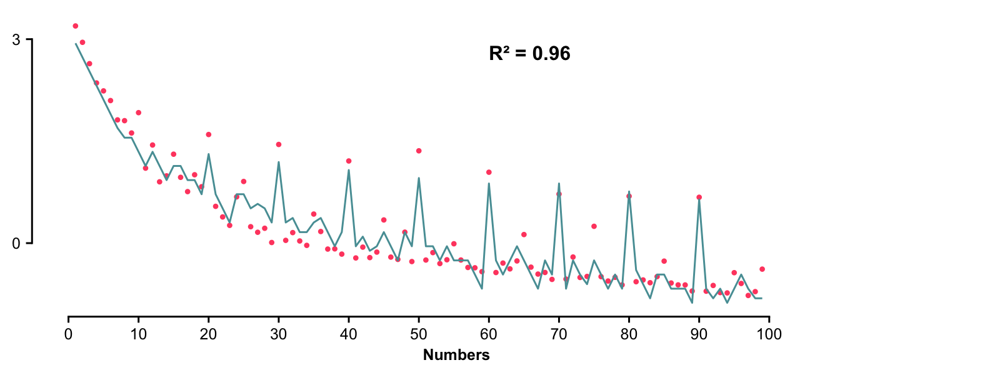

In [8]:
%%R -w 8 -h 3 --units in -r 200 

data <- read.csv('temp.csv')
R2 <- round(data$R2[1],2)
pl_model_with10 <- data %>%
    ggplot(aes(x = numbers)) +
    geom_point(aes(y = log_freq, color='line'),size=0.8) +
    geom_line(aes(y = predictions, color='point'), linewidth=0.5) +
    annotate("text", x = 60, y = 2.8, label = paste("R² =", R2), size = 4, hjust = 0, fontface = "bold") +
    theme(legend.position = "none",
            axis.title.y=element_blank(),
            panel.grid.major.y = element_blank(),
            axis.title.x = element_text(face="bold", size=9, hjust=0.44, family='Arial')) +
    labs(x = "Numbers") +
    scale_color_manual(values=moma.colors("Klein")) +
    xlim(1,125) +
    guides(x = guide_axis_manual(trunc_lower=0, trunc_upper=100, breaks=seq(0,100,10)),
            y = guide_axis_manual(trunc_lower=0, trunc_upper=3, breaks=c(0,3)))

ggsave("plots/S3B_model_english_with10.svg", pl_model_with10, device='svg',width = 8, height = 3, units = "in")
pl_model_with10

# Fitting all languages

In [12]:
# special case for french and average because there are no values for 97, 98 and 99

def get_probs_max_fr(add_cost, mult_cost, f1):
    number_probs = np.zeros(97)
    number_probs[0] = 1
    number_probs[1] = f1    

    for i in range(1,97):
        if number_probs[i]==0:
            for j in range(1,i//2 +1):
                number_probs[i] = max(number_probs[i],number_probs[j]*number_probs[i-j]*add_cost) 
            for j in range(2, int(np.sqrt(i))+1):
                if i%j==0:
                    number_probs[i]= max(number_probs[i],number_probs[j]*number_probs[i//j]*mult_cost)
    return np.log10(number_probs[1:100])

def loss_function_fr(params, target_vector):
    add_cost, mult_cost, f1 = params
    predictions = get_probs_max_fr(add_cost, mult_cost, f1)
    without_10 = [i for i in range(predictions.shape[0]) if (i+1)%10!=0]
    predictions, target_vector = predictions[without_10], target_vector[without_10]
    return np.sum((predictions - target_vector) ** 2)

In [13]:
data = pd.read_csv('data_ngram_allLangsPerMilion.csv')
df = data[data.lang.isin(['en'])]
freqs = df.corrected_total_freq
initial_guess = [freqs[1]/freqs[0]/freqs[0], freqs[5]/freqs[1]/freqs[2], freqs[0]]
# we take as an initial guess the one for english because for most languages, 
# f(1)<f(2) which makes this initial guess useless

def fit_model(lang='en'):

    if lang in ['fr', 'mean']:
        get_probs = get_probs_max_fr
        loss = loss_function_fr
        numbers = [i+1 for i in range(96)]
    else:
        get_probs = get_probs_max
        loss = loss_function
        numbers = [i+1 for i in range(99)]

    data = pd.read_csv('data_ngram_allLangsPerMilion.csv')

    df = data[data.lang.isin([lang])]
    target = np.array(df['log_freq'])

    result = minimize(loss, initial_guess, args=(target,), method = 'Nelder-Mead')
    best_params = result.x

    print("Optimized Parameters:", best_params)
    predictions = get_probs(*best_params)

    penalty = optimize_penalty(predictions, target)
    print(f'Optimized penalty: {penalty}')
    predictions_with_10 = fit_10(predictions, penalty)

    R2 = (pearsonr(predictions_with_10,df.log_freq).statistic)**2

    print(lang)
    print(R2)
    preds = {
        'number':numbers,
        'log_freq': df.log_freq,
        'predictions':predictions_with_10,
        'R2':[R2]*len(numbers),
        'lang':[lang]*len(numbers)
    }
    df2 = pd.DataFrame(preds)
    return df2

In [14]:
languages = ['en', 'fr', 'it', 'es', 'de', 'ru', 'mean']
data = pd.concat(fit_model(lang) for lang in languages)
data.to_csv('temp.csv')

Optimized Parameters: [7.10827529e-04 3.17776166e-04 8.71588692e+02]
Optimized penalty: 0.5656927052061874
en
0.9561249463224157
Optimized Parameters: [3.92207796e-04 1.64411031e-04 1.50034592e+03]
Optimized penalty: 0.557417320058498
fr
0.952234158485912
Optimized Parameters: [4.36386970e-04 1.96646557e-04 1.30080323e+03]
Optimized penalty: 0.5231764953267038
it
0.9481984402679559
Optimized Parameters: [7.78304545e-04 5.50894299e-04 8.07282658e+02]
Optimized penalty: 0.6984822978024942
es
0.912686032172316
Optimized Parameters: [5.26458316e-04 2.26705264e-04 1.02011134e+03]
Optimized penalty: 0.42701644163266045
de
0.9467533213811505
Optimized Parameters: [1.55517944e-03 6.65048946e-04 3.88890498e+02]
Optimized penalty: 0.5755933493517457
ru
0.9387312761335076
Optimized Parameters: [6.69961661e-04 2.81960135e-04 8.96788527e+02]
Optimized penalty: 0.5551000834887811
mean
0.9567844178919764


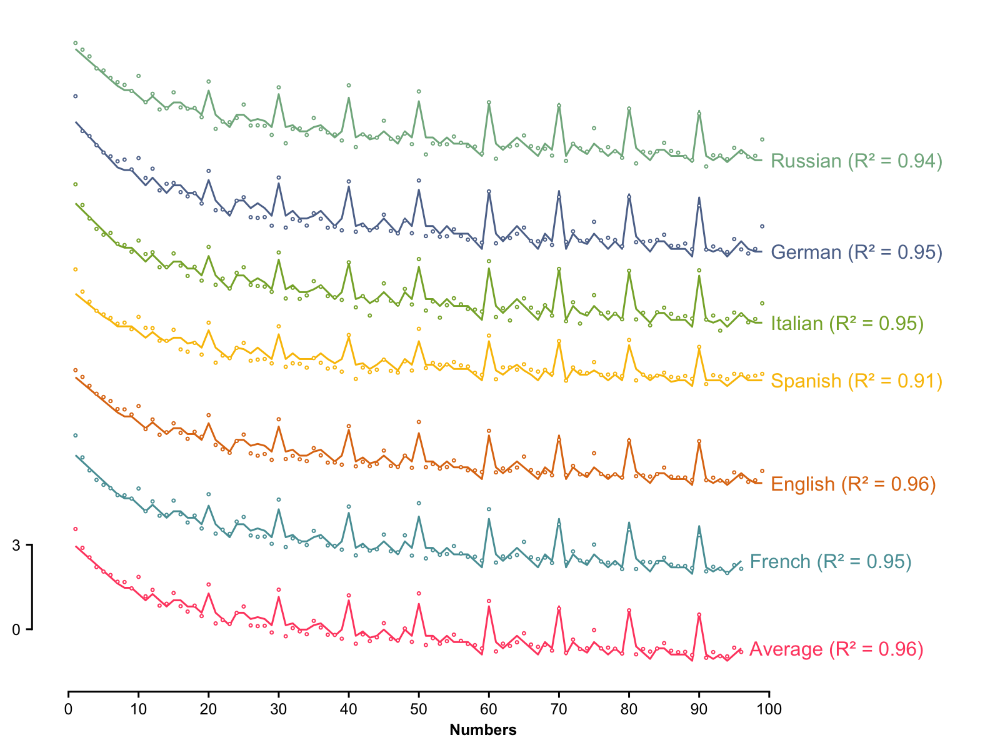

In [12]:
%%R -w 8 -h 6 --units in -r 200 


pl_all_languages <-
  read.csv("temp.csv") %>%
  mutate(nicelang =
         case_when(
          lang == "mean" ~ "Average",
          lang == "fr" ~ "French",
          lang == "en" ~ "English",
          lang == "it" ~ "Italian",
          lang == "de" ~ "German",
          lang == "es" ~ "Spanish",
          lang == "ru" ~ "Russian",
          
          )) %>%
  mutate(nicelang = factor(nicelang, levels=c('Average',"French", "English", "Spanish", "Italian", "German", "Russian"))) %>%
  filter(number > 0, number < 100) %>%
  group_by(nicelang) %>%
  mutate(label = if_else(number == max(number), 
                         paste0(nicelang, " (R² = ", round(R2, 2), ")"), 
                         NA_character_)) %>%
  ungroup %>%
  ggplot(aes(x = number, y = 3*(as.numeric(nicelang)-1) + predictions, color=nicelang, group=nicelang)) +
  geom_line(linewidth=0.5) +
  geom_point(aes(y = 3*(as.numeric(nicelang)-1) + log_freq), size = 0.5, shape = 21, fill = "white") +  # Scatter plot for log_freq

  geom_text_repel(aes(label = label), size=4, nudge_x = 4, na.rm = TRUE) +
  theme(legend.position = "none",
        axis.title.y=element_blank(),
        panel.grid.major.y = element_blank(),
        axis.title.x = element_text(face="bold", size=9, hjust=0.47, family='Arial')) +
  labs(x = "Numbers") +

  scale_color_manual(values=moma.colors("Klein")) +
  xlim(1,125) +
  guides(x = guide_axis_manual(trunc_lower=0, trunc_upper=100, breaks=seq(0,100,10)),
         y = guide_axis_manual(trunc_lower=0, trunc_upper=3, breaks=c(0,3)))
ggsave(filename = "plots/S3_all_languages_fitted.svg", device='svg', plot = pl_all_languages, width = 8, height = 6)
pl_all_languages

# Boostrapping

In [6]:
data = pd.read_csv('data_ngram_allLangsPerMilion.csv')
df = data[data.lang.isin(['en'])]
freqs = df.corrected_total_freq
initial_guess = [freqs[1]/freqs[0]/freqs[0], freqs[5]/freqs[1]/freqs[2], freqs[0]]
# we take as an initial guess the one for english because for most languages, 
# f(1)<f(2) which makes this initial guess useless

def fit_model_randomized():

    get_probs = get_probs_max
    loss = loss_function

    data = pd.read_csv('data_ngram_allLangsPerMilion.csv')

    df = data[data.lang.isin(['en'])]
    # Shuffle the log_freqs
    target = np.array(df['log_freq'])
    np.random.shuffle(target)

    result = minimize(loss, initial_guess, args=(target,), method = 'Nelder-Mead')
    best_params = result.x

    predictions = get_probs(*best_params)

    penalty = optimize_penalty(predictions, target)
    predictions_with_10 = fit_10(predictions, penalty)

    R2 = (pearsonr(predictions_with_10,df.log_freq).statistic)**2 
   
    return R2

R2s = []
for i in range(1000):
    R2s.append(fit_model_randomized())


In [ ]:
0.9561249463224157

In [17]:
R2s.sort(reverse=True)

In [18]:
R2s

[0.9567853344567511,
 0.9564089756103841,
 0.9545125040638637,
 0.9534027006368241,
 0.9530928969975314,
 0.949130735182135,
 0.9488786207394154,
 0.9465292022167245,
 0.9463054235045877,
 0.942409566260351,
 0.9409316806030368,
 0.9408891587808856,
 0.9404609218987472,
 0.9401421373296762,
 0.9399732361958955,
 0.9397675805286868,
 0.9396602961646728,
 0.9392680820146567,
 0.939138530462571,
 0.9364240567541627,
 0.9355783229663377,
 0.9352567310495579,
 0.9345631015088963,
 0.9342487587626747,
 0.9342349149376924,
 0.9338757419421828,
 0.9306693805544916,
 0.9297023466120198,
 0.9286538383580452,
 0.9286473113365021,
 0.9284798265330847,
 0.9280354376212133,
 0.9273511765965039,
 0.9267139165911233,
 0.9263939501515815,
 0.9261080807629981,
 0.9249199126595188,
 0.9239429329940944,
 0.9238189703535842,
 0.9236680836564258,
 0.9220229984457933,
 0.9219757789481589,
 0.9207313119235325,
 0.9205498913503876,
 0.9195349284965908,
 0.9179510847433392,
 0.9171661592848469,
 0.9157862631385

In [7]:
df2 = pd.DataFrame({'R2s':R2s})
df2.to_csv('temp.csv')

In addition: Warning messages:
1: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.
This warning is displayed once every 8 hours.
Call `lifecycle::last_lifecycle_warnings()` to see where this warning was
generated. 
2: The S3 guide system was deprecated in ggplot2 3.5.0.
ℹ It has been replaced by a ggproto system that can be extended.
This warning is displayed once every 8 hours.
Call `lifecycle::last_lifecycle_warnings()` to see where this warning was
generated. 


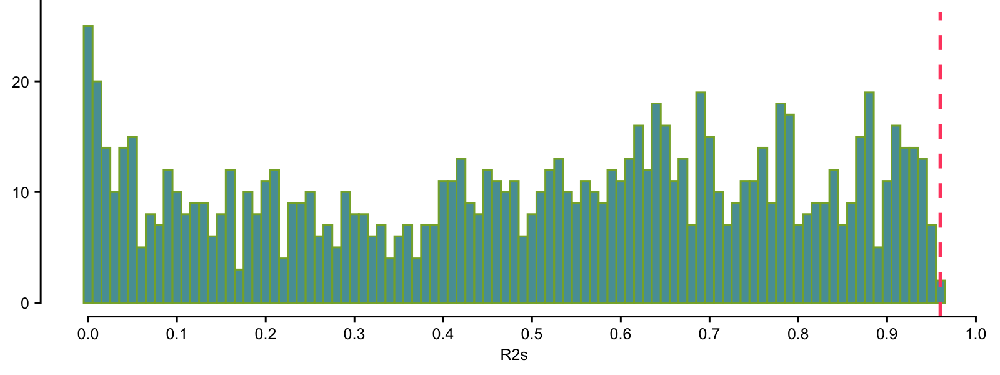

In [8]:
%%R -w 8 -h 3 --units in -r 200 

my_colors <- moma.colors("Klein")

data <- read.csv('temp.csv')
R2 = 0.96
pl_bootstrapping <- data %>%
  ggplot(aes(x = R2s)) +
  geom_histogram(binwidth = 0.01,color=my_colors[5], fill=my_colors[2]) +  # Histogram settings
  geom_vline(xintercept = R2 ,color=my_colors[1], linetype = "dashed", size = 1) +  # Single value line
  labs(x = "R2s") +
  theme(legend.position = "none",
            axis.title.y=element_blank(),
            panel.grid.major.y = element_blank()) +
  guides(x = guide_axis_manual(trunc_lower=0, trunc_upper=1, breaks=seq(0,1,0.10)),
         y = guide_axis_manual(trunc_lower=0, trunc_upper=50, breaks=seq(0,50,10)))
              # annotate("text", x = R2-0.07, y = 60, label = 'Our model', vjust = -1)

ggsave("plots/S4_bootstrapping.svg", pl_bootstrapping, device='svg',width = 8, height = 3, units = "in")
pl_bootstrapping

# Tests

In [13]:
def get_probs_min(add_cost, mult_cost, f1):
    number_probs = np.ones(100)*np.inf
    number_probs[0]=1
    number_probs[1] = f1    
    for i in range(1,100):
        if number_probs[i]==np.inf:
            for j in range(1,i//2 +1):
                number_probs[i] = min(number_probs[i],number_probs[j]*number_probs[i-j]*add_cost) 
            for j in range(2, int(np.sqrt(i))+1):
                if i%j==0:
                    number_probs[i]= min(number_probs[i],number_probs[j]*number_probs[i//j]*mult_cost)
    return np.log10(number_probs[1:100])

def loss_function(params, target_vector):
    add_cost, mult_cost, f1 = params
    predictions = get_probs_min(add_cost, mult_cost, f1)
    predictions, target_vector = predictions, target_vector
    return np.sum((predictions - target_vector) ** 2)

In [16]:
data = pd.read_csv('data_ngram_allLangsPerMilion.csv')

df = data[data.lang.isin(['en'])]
target = np.array(df['log_freq'])
freqs = df.corrected_total_freq
## we define the initial guess for the optimization as what would be 
##the parameters accounting for the first few numbers
## so that the initial guess is in the right neigborhood
initial_guess = [freqs[1]/freqs[0]/freqs[0], freqs[5]/freqs[1]/freqs[2], freqs[0]]
##            = freq(2)/freq(1)^2             , freq(6)/(freq(2)*freq(3))    , freq(1)   
print(f'Inital guess: {initial_guess}')
result = minimize(loss_function, initial_guess, args=(target,), method = 'Nelder-Mead')
best_params = result.x

print("Optimized Parameters:", best_params)
predictions = get_probs_min(*best_params)
R2 = (r2_score(predictions,df.log_freq))
print(f'R2 = {R2}')

numbers = [i+1 for i in range(99)]
preds = {
    'numbers':numbers,
    'log_freq': df.log_freq,
    'predictions':predictions,
    'R2':[R2]*len(numbers)

}
df2 = pd.DataFrame(preds)
df2.to_csv('temp.csv')


Inital guess: [0.0003669579382946686, 0.0003186047933210102, 1565.2685127018156]
Optimized Parameters: [2.38520332e-03 2.38949464e-03 3.79902748e+02]
R2 = 0.5887687217703756


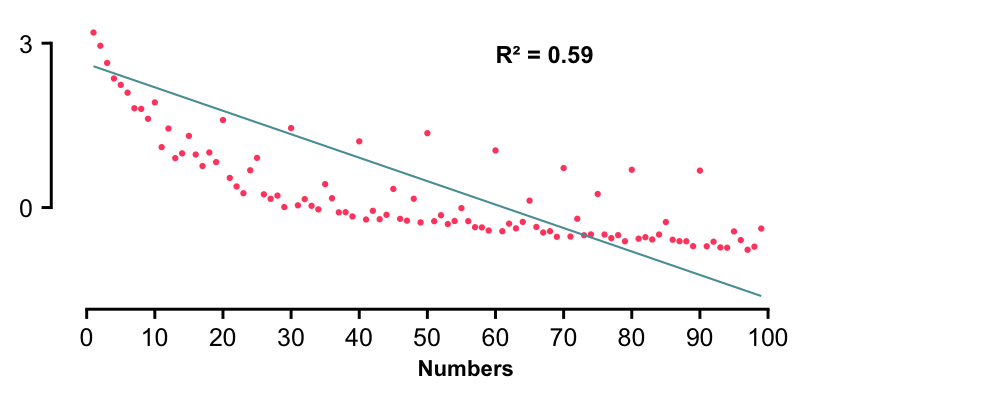

In [17]:
%%R -w 5 -h 2 --units in -r 200 

data <- read.csv('temp.csv')
R2 <- round(data$R2[1],2)
pl_model <- data %>%
    ggplot(aes(x = numbers)) +
    geom_point(aes(y = log_freq, color='line'),size=0.4) +
    geom_line(aes(y = predictions, color='point'), linewidth=0.35) +
    annotate("text", x = 60, y = 2.8, label = paste("R² =", R2), size = 3, hjust = 0, fontface = "bold") +
    theme(legend.position = "none",
            axis.title.y=element_blank(),
            panel.grid.major.y = element_blank(),
            axis.title.x = element_text(face="bold", size=8, hjust=0.44, family='Arial')) +
    labs(x = "Numbers") +
    scale_color_manual(values=moma.colors("Klein")) +
    xlim(1,125) +
    guides(x = guide_axis_manual(trunc_lower=0, trunc_upper=100, breaks=seq(0,100,10)),
            y = guide_axis_manual(trunc_lower=0, trunc_upper=3, breaks=c(0,3)))

# ggsave("plots/4B_model_english_MDL.svg", pl_model, device='svg',width = 5, height = 2, units = "in")
pl_model